<a href="https://colab.research.google.com/github/alex-loo/electricty_market/blob/main/usage_boxplots.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [224]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [225]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [226]:
!pip install -- update plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [227]:
temp_a = pd.read_csv("/content/drive/MyDrive/Python/AAR/Data Analysis/data/20gw_combined.csv")
temp_b = pd.read_csv("/content/drive/MyDrive/Python/AAR/Data Analysis/data/27pl_combined.csv")
temp_c = pd.read_csv("/content/drive/MyDrive/Python/AAR/Data Analysis/data/8ta20_combined.csv")

temp_d = pd.read_csv("/content/drive/MyDrive/Python/AAR/Data Analysis/data/103df.csv")
temp_e = pd.read_csv("/content/drive/MyDrive/Python/AAR/Data Analysis/data/11css.csv")
temp_f = pd.read_csv("/content/drive/MyDrive/Python/AAR/Data Analysis/data/30twr.csv")
temp_g = pd.read_csv("/content/drive/MyDrive/Python/AAR/Data Analysis/data/8_10pc_combined.csv")

In [228]:
# Checking formats
# temp_a.tail()
# temp_b.tail()
# temp_c.tail()
# temp_d.head()
# temp_e.head()
# temp_f.tail()
# temp_g.head()

In [229]:
#Creating Datetime objects
df_list = [temp_a, temp_b, temp_c, temp_d, temp_e, temp_f, temp_g]

for df in df_list:
  df.Date = pd.to_datetime(df.Date, format='%d/%m/%Y')

In [230]:
#Processing Batch 2 data to match batch 1
temp_d = temp_d.set_index("Date").stack().reset_index().rename(
              columns={'level_1': 'Period', 0:'Period_kWh'})
temp_e = temp_e.set_index("Date").stack().reset_index().rename(
              columns={'level_1': 'Period', 0:'Period_kWh'})
temp_f = temp_f.set_index("Date").stack().reset_index().rename(
              columns={'level_1': 'Period', 0:'Period_kWh'})
temp_g = temp_g.set_index("Date").stack().reset_index().rename(
              columns={'level_1': 'Period', 0:'Period_kWh'})

In [231]:
for df in [temp_d, temp_e, temp_f, temp_g]:
  df['Period'] = df['Period'].astype('int')
  df['Period_kWh'] = df['Period_kWh'].astype('float')
  df['day_of_week'] = df['Date'].dt.dayofweek
  df['weekend'] = df['day_of_week'] >= 5

In [232]:
for df in df_list:
  df['day_of_week'] = df['Date'].dt.dayofweek
  df['weekend'] = df['day_of_week'] >= 5

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


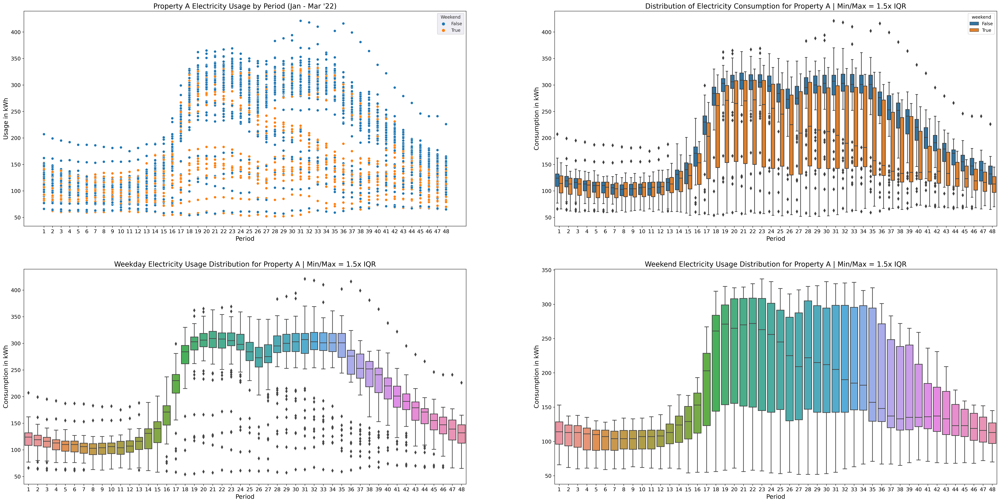

In [233]:
plt.figure(figsize=(40,20), dpi=300)

plt.subplot(221)
plt.xticks(ticks=range(1,49), fontsize=12)
plt.yticks(fontsize=12)
plt.title("Property A Electricity Usage by Period (Jan - Mar '22)", fontsize=16)
plt.xlabel('Period', fontsize=14)
plt.ylabel('Usage in kWh', fontsize=14)
with sns.axes_style('darkgrid'):
  sns.scatterplot(temp_a.Period,
                  temp_a.Period_kWh,
                  hue = temp_a.weekend)
  plt.legend(title='Weekend', fontsize='medium')

plt.subplot(222)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Distribution of Electricity Consumption for Property A | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_a,
            x='Period',
            y='Period_kWh',
            hue='weekend')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(223)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekday Electricity Usage Distribution for Property A | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_a[temp_a.weekend == False],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(224)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekend Electricity Usage Distribution for Property A | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_a[temp_a.weekend == True],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.savefig("/content/drive/MyDrive/Python/AAR/Data Analysis/output/boxplots/a_combo.png")

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


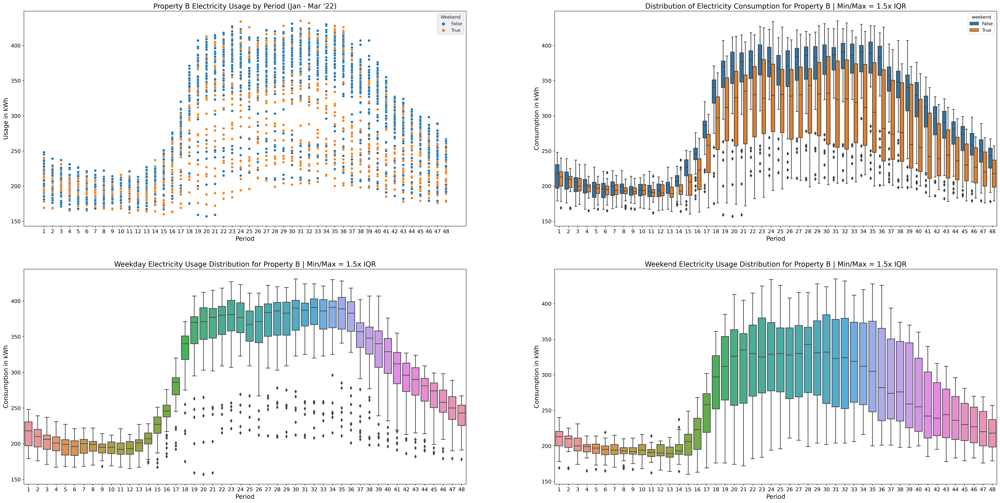

In [234]:
plt.figure(figsize=(40,20), dpi=300)

plt.subplot(221)
plt.xticks(ticks=range(1,49), fontsize=12)
plt.yticks(fontsize=12)
plt.title("Property B Electricity Usage by Period (Jan - Mar '22)", fontsize=16)
plt.xlabel('Period', fontsize=14)
plt.ylabel('Usage in kWh', fontsize=14)
with sns.axes_style('darkgrid'):
  sns.scatterplot(temp_b.Period,
                  temp_b.Period_kWh,
                  hue = temp_b.weekend)
  plt.legend(title='Weekend', fontsize='medium')

plt.subplot(222)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Distribution of Electricity Consumption for Property B | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_b,
            x='Period',
            y='Period_kWh',
            hue='weekend')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(223)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekday Electricity Usage Distribution for Property B | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_b[temp_b.weekend == False],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(224)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekend Electricity Usage Distribution for Property B | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_b[temp_b.weekend == True],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.savefig("/content/drive/MyDrive/Python/AAR/Data Analysis/output/boxplots/b_combo.png")

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


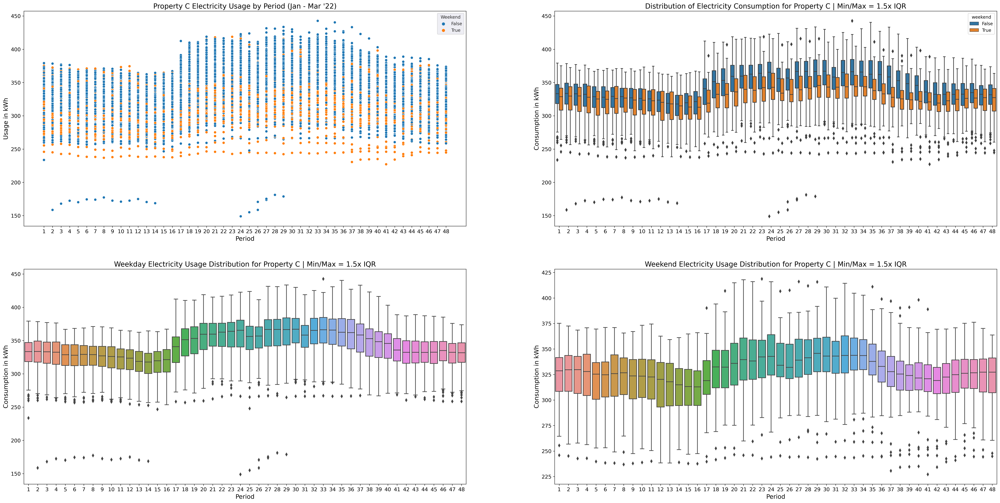

In [235]:
plt.figure(figsize=(40,20), dpi=300)

plt.subplot(221)
plt.xticks(ticks=range(1,49), fontsize=12)
plt.yticks(fontsize=12)
plt.title("Property C Electricity Usage by Period (Jan - Mar '22)", fontsize=16)
plt.xlabel('Period', fontsize=14)
plt.ylabel('Usage in kWh', fontsize=14)
with sns.axes_style('darkgrid'):
  sns.scatterplot(temp_c.Period,
                  temp_c.Period_kWh,
                  hue = temp_c.weekend)
  plt.legend(title='Weekend', fontsize='medium')

plt.subplot(222)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Distribution of Electricity Consumption for Property C | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_c,
            x='Period',
            y='Period_kWh',
            hue='weekend')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(223)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekday Electricity Usage Distribution for Property C | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_c[temp_c.weekend == False],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(224)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekend Electricity Usage Distribution for Property C | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_c[temp_c.weekend == True],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.savefig("/content/drive/MyDrive/Python/AAR/Data Analysis/output/boxplots/c_combo.png")

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


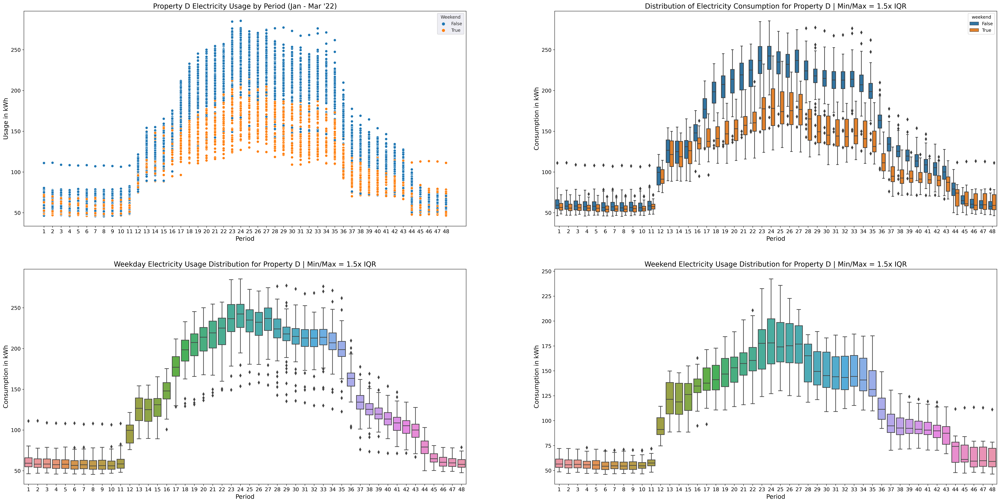

In [236]:
plt.figure(figsize=(40,20), dpi=300)

plt.subplot(221)
plt.xticks(ticks=range(1,49), fontsize=12)
plt.yticks(fontsize=12)
plt.title("Property D Electricity Usage by Period (Jan - Mar '22)", fontsize=16)
plt.xlabel('Period', fontsize=14)
plt.ylabel('Usage in kWh', fontsize=14)
with sns.axes_style('darkgrid'):
  sns.scatterplot(temp_d.Period,
                  temp_d.Period_kWh,
                  hue = temp_d.weekend)
  plt.legend(title='Weekend', fontsize='medium')

plt.subplot(222)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Distribution of Electricity Consumption for Property D | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_d,
            x='Period',
            y='Period_kWh',
            hue='weekend')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(223)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekday Electricity Usage Distribution for Property D | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_d[temp_d.weekend == False],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(224)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekend Electricity Usage Distribution for Property D | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_d[temp_d.weekend == True],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.savefig("/content/drive/MyDrive/Python/AAR/Data Analysis/output/boxplots/d_combo.png")

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


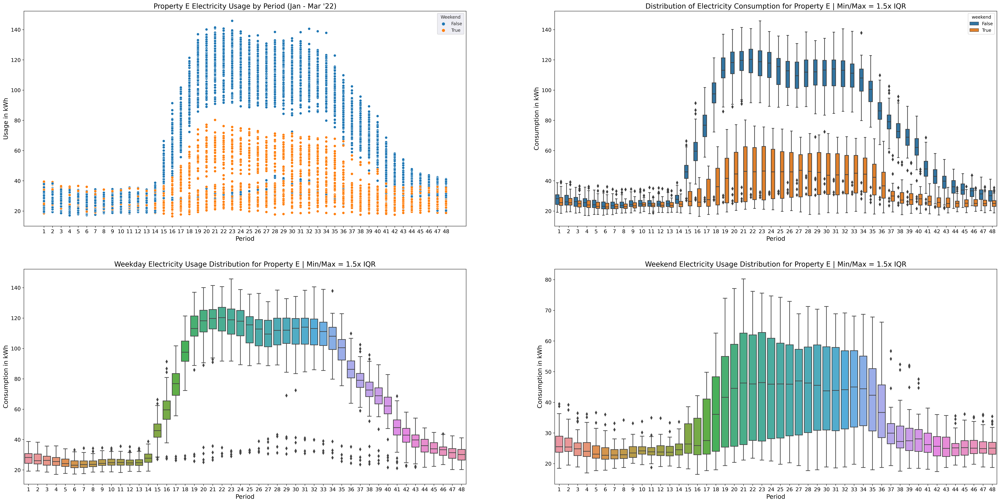

In [237]:
plt.figure(figsize=(40,20), dpi=300)

plt.subplot(221)
plt.xticks(ticks=range(1,49), fontsize=12)
plt.yticks(fontsize=12)
plt.title("Property E Electricity Usage by Period (Jan - Mar '22)", fontsize=16)
plt.xlabel('Period', fontsize=14)
plt.ylabel('Usage in kWh', fontsize=14)
with sns.axes_style('darkgrid'):
  sns.scatterplot(temp_e.Period,
                  temp_e.Period_kWh,
                  hue = temp_e.weekend)
  plt.legend(title='Weekend', fontsize='medium')

plt.subplot(222)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Distribution of Electricity Consumption for Property E | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_e,
            x='Period',
            y='Period_kWh',
            hue='weekend')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(223)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekday Electricity Usage Distribution for Property E | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_e[temp_e.weekend == False],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(224)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekend Electricity Usage Distribution for Property E | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_e[temp_e.weekend == True],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.savefig("/content/drive/MyDrive/Python/AAR/Data Analysis/output/boxplots/e_combo.png")

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


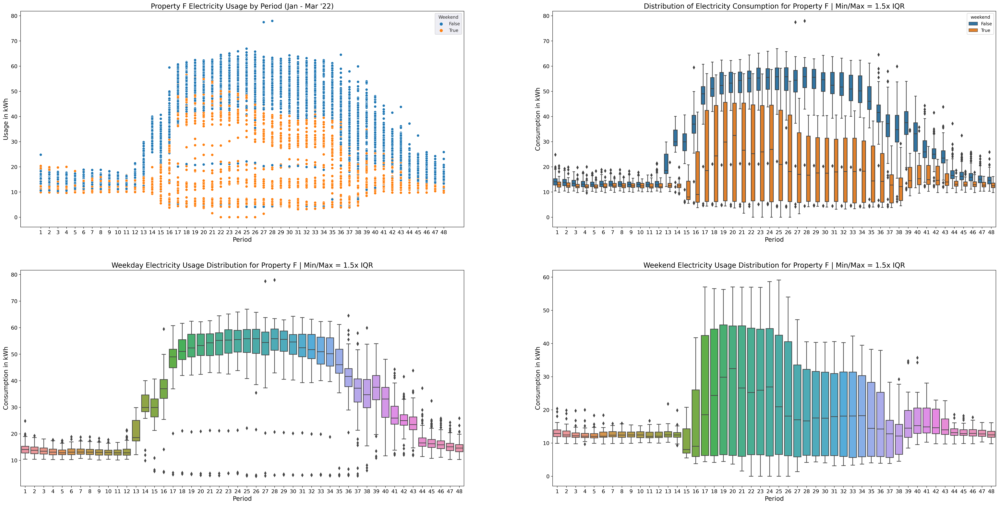

In [238]:
plt.figure(figsize=(40,20), dpi=300)

plt.subplot(221)
plt.xticks(ticks=range(1,49), fontsize=12)
plt.yticks(fontsize=12)
plt.title("Property F Electricity Usage by Period (Jan - Mar '22)", fontsize=16)
plt.xlabel('Period', fontsize=14)
plt.ylabel('Usage in kWh', fontsize=14)
with sns.axes_style('darkgrid'):
  sns.scatterplot(temp_f.Period,
                  temp_f.Period_kWh,
                  hue = temp_f.weekend)
  plt.legend(title='Weekend', fontsize='medium')

plt.subplot(222)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Distribution of Electricity Consumption for Property F | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_f,
            x='Period',
            y='Period_kWh',
            hue='weekend')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(223)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekday Electricity Usage Distribution for Property F | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_f[temp_f.weekend == False],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(224)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekend Electricity Usage Distribution for Property F | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_f[temp_f.weekend == True],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.savefig("/content/drive/MyDrive/Python/AAR/Data Analysis/output/boxplots/f_combo.png")

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


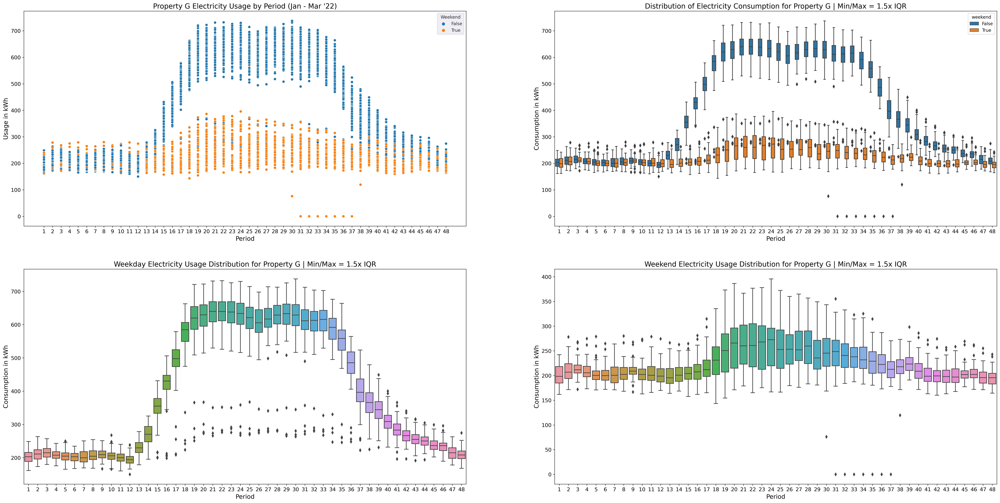

In [239]:
plt.figure(figsize=(40,20), dpi=300)

plt.subplot(221)
plt.xticks(ticks=range(1,49), fontsize=12)
plt.yticks(fontsize=12)
plt.title("Property G Electricity Usage by Period (Jan - Mar '22)", fontsize=16)
plt.xlabel('Period', fontsize=14)
plt.ylabel('Usage in kWh', fontsize=14)
with sns.axes_style('darkgrid'):
  sns.scatterplot(temp_g.Period,
                  temp_g.Period_kWh,
                  hue = temp_g.weekend)
  plt.legend(title='Weekend', fontsize='medium')

plt.subplot(222)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Distribution of Electricity Consumption for Property G | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_g,
            x='Period',
            y='Period_kWh',
            hue='weekend')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(223)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekday Electricity Usage Distribution for Property G | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_g[temp_g.weekend == False],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.subplot(224)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Weekend Electricity Usage Distribution for Property G | Min/Max = 1.5x IQR", fontsize=16)
sns.boxplot(data=temp_g[temp_g.weekend == True],
            x='Period',
            y='Period_kWh')
plt.xlabel("Period", fontsize=14)
plt.ylabel("Consumption in kWh", fontsize=14)

plt.savefig("/content/drive/MyDrive/Python/AAR/Data Analysis/output/boxplots/g_combo.png")